In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import math

import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.auto import tqdm

import ddpm
import datasets

# Ablations

# 2D

In [5]:
def plot_ablation(frames_dict, outname):
    num_rows = len(frames_dict)
    num_cols = 10

    fig = plt.figure(figsize=(3.5*num_cols, 3*num_rows + 0.5))
    row = 0

    for name, frames in frames_dict.items():
        epoch_step = len(frames) // num_cols
        offset = row*(num_cols + 1)
        plt.subplot(num_rows, num_cols + 1, offset + 1)
        plt.scatter(0, 0, alpha=0)
        plt.text(0, 0, name, fontdict={"size": 30})
        plt.xlim(-0.25, 2)
        plt.axis("off")

        for i in range(num_cols):
            plt.subplot(num_rows, num_cols + 1, offset + i + 2)
            ix = i * epoch_step
            frame = frames[ix]
            plt.scatter(frame[:, 0], frame[:, 1], s=5, alpha=0.7)
            if row == 0:
                if i == 0:
                    title = f"epoch {ix}"
                else:
                    title = f"{ix}"
                plt.title(title, fontdict={"size": 30}, pad=30)
            plt.xlim(-3.5, 3.5)
            plt.ylim(-4., 4.75)
            plt.axis("off")

        row += 1

    plt.tight_layout()
    plt.savefig(outname, facecolor="white")
    plt.show()

### datasets

In [3]:
!python ddpm.py --dataset moons --experiment_name moons_base
!python ddpm.py --dataset dino --experiment_name dino_base
!python ddpm.py --dataset line --experiment_name line_base
!python ddpm.py --dataset circle --experiment_name circle_base

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 988.90it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1001.58it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 983.95it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 995.39it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


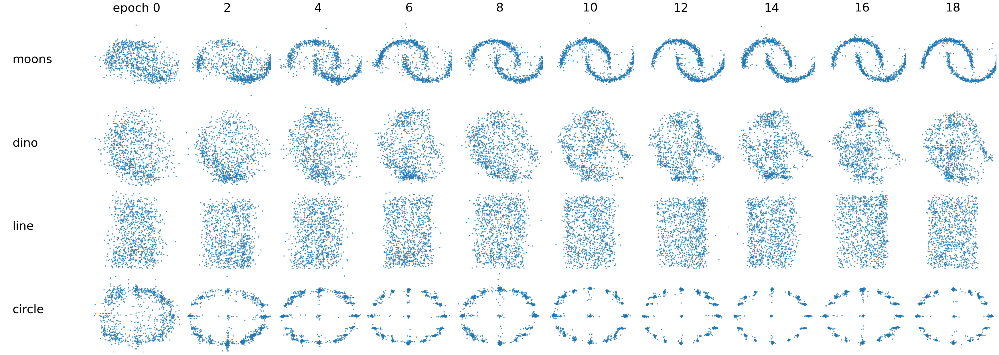

In [6]:
frames_dict = {
    "moons": np.load("exps/moons_base/frames.npy"),
    "dino": np.load("exps/dino_base/frames.npy"),
    "line": np.load("exps/line_base/frames.npy"),
    "circle": np.load("exps/circle_base/frames.npy"),
}

plot_ablation(frames_dict, "static/datasets.png")

In the source code repository, it was noted that the model configuration struggles with the line dataset after 200 epochs, even though it is the simplest one. The expectation was that the corners should be clear and sharp, but they turned out fuzzy.

In our experiments, we plotted the denoised data over 20 epochs using the same original parameters, and the line dataset produced much better results—a sharp rectangular shape like the target distribution. We also observed that the initial noisy image is slightly different and more diffuse than that seen in the original repository, suggesting that the reverse process might be sensitive to the shape of the initial noisy data.

### learning rate

In [7]:
!python ddpm.py --learning_rate 1e-2 --experiment_name dino_lr1e-2
!python ddpm.py --learning_rate 1e-3 --experiment_name dino_lr1e-3
!python ddpm.py --learning_rate 1e-4 --experiment_name dino_lr1e-4
!python ddpm.py --learning_rate 1e-5 --experiment_name dino_lr1e-5

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 978.52it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 999.73it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 993.92it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1006.31it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


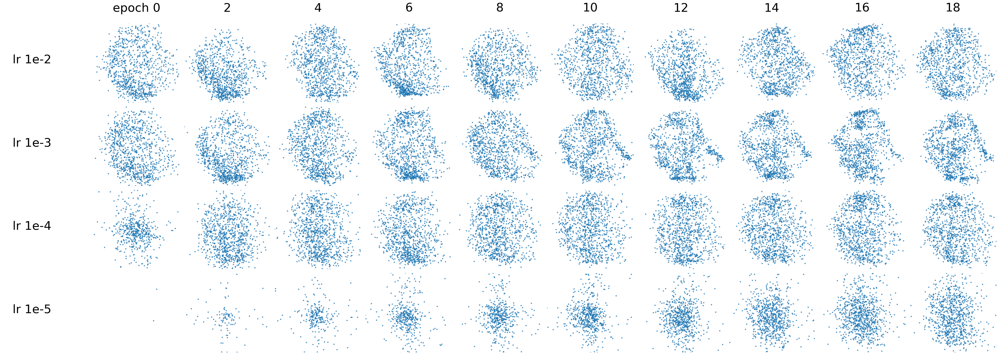

In [8]:
frames_dict = {
    "lr 1e-2": np.load("exps/dino_lr1e-2/frames.npy"),
    "lr 1e-3": np.load("exps/dino_lr1e-3/frames.npy"),
    "lr 1e-4": np.load("exps/dino_lr1e-4/frames.npy"),
    "lr 1e-5": np.load("exps/dino_lr1e-5/frames.npy"),
}

plot_ablation(frames_dict, "static/learning_rate.png")

A learning rate `lr=1e-3` allows the dino shape to vaguely appear at the 10 epoch mark unlike other `lr` values which require more or simply don't allow the model to learn efficiently in the current configuration

### num_timesteps

In [9]:
!python ddpm.py --num_timesteps 5 --experiment_name dino_timesteps5
!python ddpm.py --num_timesteps 10 --experiment_name dino_timesteps10
!python ddpm.py --num_timesteps 25 --experiment_name dino_timesteps25
!python ddpm.py --num_timesteps 50 --experiment_name dino_timesteps50
!python ddpm.py --num_timesteps 100 --experiment_name dino_timesteps100
!python ddpm.py --num_timesteps 250 --experiment_name dino_timesteps250

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|████████████████████████████████████████████| 5/5 [00:00<00:00, 995.75it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████████| 10/10 [00:00<00:00, 992.92it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████████| 25/25 [00:00<00:00, 1008.25it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 981.63it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|████████████████████████████████████████| 100/100 [00:00<00:00, 988.90it/s]
Saving model...

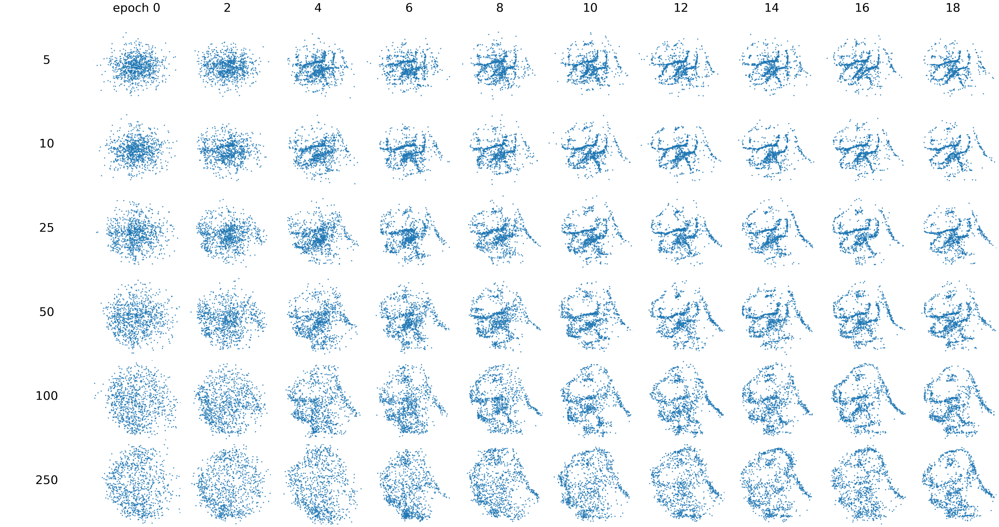

In [10]:
frames_dict = {
    "        5": np.load("exps/dino_timesteps5/frames.npy"),
    "       10": np.load("exps/dino_timesteps10/frames.npy"),
    "       25": np.load("exps/dino_timesteps25/frames.npy"),
    "       50": np.load("exps/dino_timesteps50/frames.npy"),
    "      100": np.load("exps/dino_timesteps100/frames.npy"),
    "      250": np.load("exps/dino_timesteps250/frames.npy"),
}

plot_ablation(frames_dict, "static/num_timesteps.png")

### beta schedule

In [11]:
!python ddpm.py --beta_schedule quadratic --experiment_name dino_quadratic_schedule

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 982.89it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


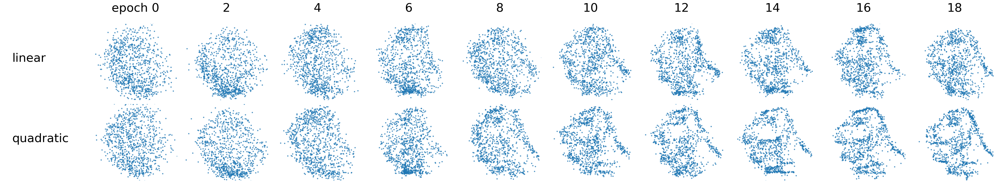

In [12]:
frames_dict = {
    "linear": np.load("exps/dino_base/frames.npy"),
    "quadratic": np.load("exps/dino_quadratic_schedule/frames.npy"),
}

plot_ablation(frames_dict, "static/beta_schedule.png")

### hidden size

In [13]:
!python ddpm.py --hidden_size 16 --experiment_name dino_hid_size_16
!python ddpm.py --hidden_size 32 --experiment_name dino_hid_size_32
!python ddpm.py --hidden_size 64 --experiment_name dino_hid_size_64
!python ddpm.py --hidden_size 256 --experiment_name dino_hid_size_256
!python ddpm.py --hidden_size 512 --experiment_name dino_hid_size_512

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 992.61it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1000.18it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1005.27it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 977.22it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 844.11it/s]
Saving model...

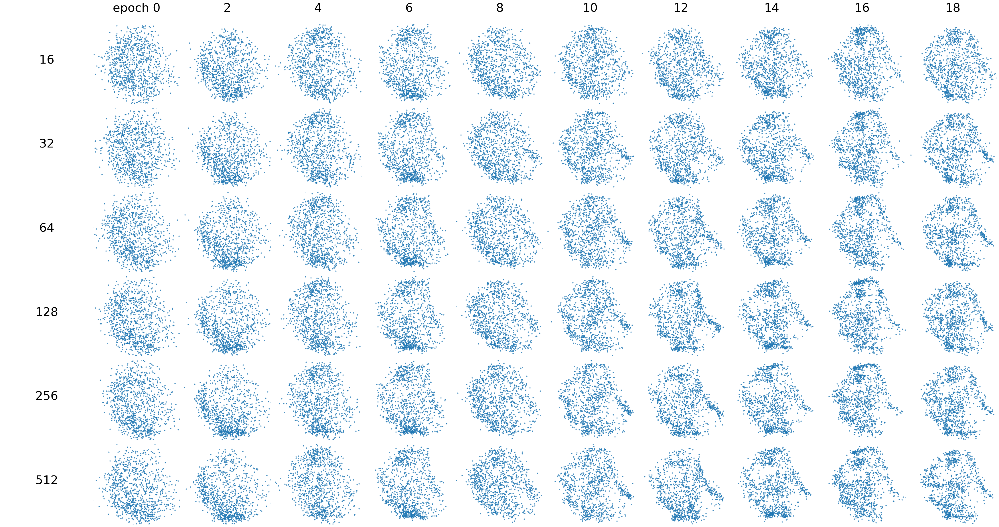

In [14]:
frames_dict = {
    "       16": np.load("exps/dino_hid_size_16/frames.npy"),
    "       32": np.load("exps/dino_hid_size_32/frames.npy"),
    "       64": np.load("exps/dino_hid_size_64/frames.npy"),
    "      128": np.load("exps/dino_base/frames.npy"),
    "      256": np.load("exps/dino_hid_size_256/frames.npy"),
    "      512": np.load("exps/dino_hid_size_512/frames.npy"),
}

plot_ablation(frames_dict, "static/hidden_size.png")

### num layers

In [15]:
!python ddpm.py --hidden_layers 1 --experiment_name dino_hid_layers_1
!python ddpm.py --hidden_layers 2 --experiment_name dino_hid_layers_2
!python ddpm.py --hidden_layers 4 --experiment_name dino_hid_layers_4
!python ddpm.py --hidden_layers 5 --experiment_name dino_hid_layers_5

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1110.07it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1039.60it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 953.95it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 894.31it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


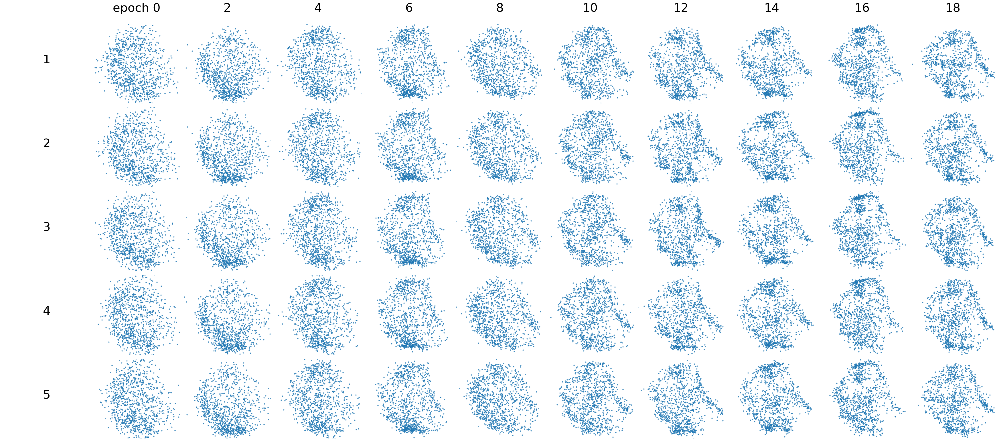

In [16]:
frames_dict = {
    "        1": np.load("exps/dino_hid_layers_1/frames.npy"),
    "        2": np.load("exps/dino_hid_layers_2/frames.npy"),
    "        3": np.load("exps/dino_base/frames.npy"),
    "        4": np.load("exps/dino_hid_layers_4/frames.npy"),
    "        5": np.load("exps/dino_hid_layers_5/frames.npy"),
    
}

plot_ablation(frames_dict, "static/num_hidden_layers.png")

### positional embedding (timestep)

In [17]:
!python ddpm.py --time_embedding learnable --experiment_name dino_time_emb_learnable
!python ddpm.py --time_embedding linear --experiment_name dino_time_emb_linear
!python ddpm.py --time_embedding zero --experiment_name dino_time_emb_zeros

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1040.59it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1069.52it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1090.60it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


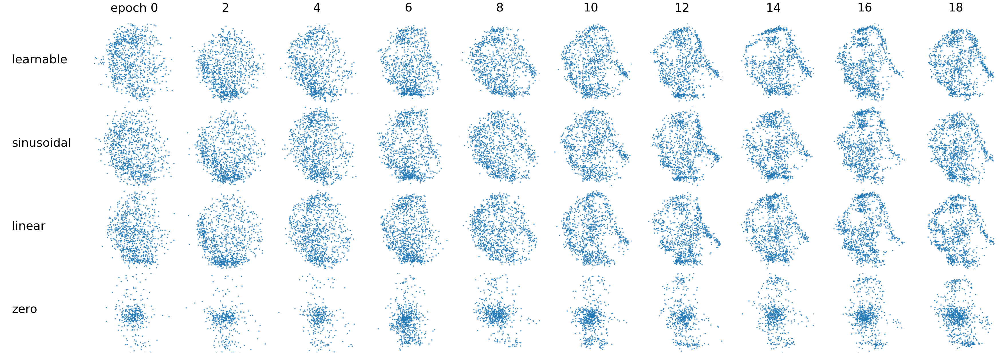

In [18]:
frames_dict = {
    "learnable": np.load("exps/dino_time_emb_learnable/frames.npy"),
    "sinusoidal": np.load("exps/dino_base/frames.npy"),
    "linear": np.load("exps/dino_time_emb_linear/frames.npy"),
    "zero": np.load("exps/dino_time_emb_zeros/frames.npy"),
}

plot_ablation(frames_dict, "static/time_embedding.png")

### positional embedding (inputs)

In [19]:
!python ddpm.py --input_embedding learnable --experiment_name dino_input_emb_learnable
!python ddpm.py --input_embedding linear --experiment_name dino_input_emb_linear
!python ddpm.py --input_embedding identity --experiment_name dino_input_emb_identity

Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1173.79it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1247.83it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A2000 12GB 

100%|█████████████████████████████████████| 1000/1000 [00:00<00:00, 1339.12it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


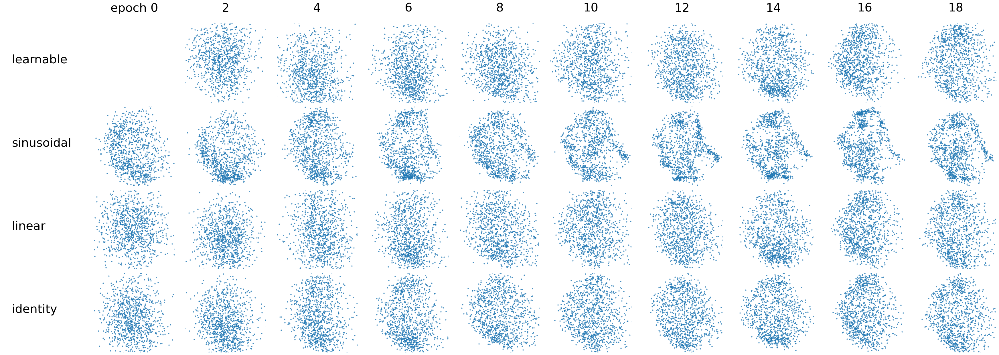

In [20]:
frames_dict = {
    "learnable": np.load("exps/dino_input_emb_learnable/frames.npy"),
    "sinusoidal": np.load("exps/dino_base/frames.npy"),
    "linear": np.load("exps/dino_input_emb_linear/frames.npy"),
    "identity": np.load("exps/dino_input_emb_identity/frames.npy"),
}

plot_ablation(frames_dict, "static/input_embedding.png")

# MNIST

Unlike with 2D data—where plotting every point is key to assessing the learned distribution—here each image is treated as an individual training sample, providing direct visual insight on how well the diffusion process is by assessing how close it is to a number.

We fix the `evaluation_batch_size` to `1` to focus on the denoising performance of a single image. 

Moreover, to ensure that the results are comparable across epochs, we set a fixed seed for the random noise generation, so that the same noise pattern is used at every epoch.

In [ ]:
def plot_training_progress(frames_dict):
    num_rows = len(frames_dict)
    num_cols = 10 

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 2 * num_rows))
    if num_rows == 1:
        axes = np.array([axes])  
    for j in range(num_cols):
        axes[0, j].set_title(f'Epoch {j}', fontsize=12)

    row = 0
    for name, frames in frames_dict.items():
        epoch_step = len(frames) // num_cols
        for j in range(num_cols):
            ax = axes[row, j]
            frame_index = j * epoch_step
            frame = frames[frame_index]

            if isinstance(frame, np.ndarray) and frame.ndim in [2, 3, 4]:
                if frame.ndim == 4 and frame.shape[0] == 1:
                    img = frame.squeeze() 
                elif frame.ndim == 3:
                    img = frame[0] 
                elif frame.ndim == 2:
                    img = frame
                else:
                    continue
            else:
                continue
            ax.imshow(img, cmap='gray')
            ax.axis('off')

        axes[row, 0].annotate(name, xy=(-0.1, 0.5), xycoords='axes fraction',
                              textcoords='offset points', va='center', ha='right', fontsize=12, color='black')
        row += 1

    plt.subplots_adjust(left=0.15, top=0.95, wspace=0.1, hspace=0.1)
    plt.show()

### learning rate

In [ ]:
!python ddpm.py --dataset mnist --learning_rate 1e-2 --experiment_name mnist_lr1e-2 --num_epochs 10  --eval_batch_size 1
!python ddpm.py --dataset mnist --learning_rate 1e-3 --experiment_name mnist_lr1e-3 --num_epochs 10  --eval_batch_size 1
!python ddpm.py --dataset mnist --learning_rate 1e-4 --experiment_name mnist_lr1e-4 --num_epochs 10  --eval_batch_size 1
!python ddpm.py --dataset mnist --learning_rate 1e-5 --experiment_name mnist_lr1e-5 --num_epochs 10 --eval_batch_size 1

Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:09<00:00, 102.31it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:07<00:00, 129.71it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 123.03it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 124.93it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


/tmp/ipykernel_2158084/3984523973.py:40: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  axes[row, 0].annotate(name, xy=(-0.1, 0.5), xycoords='axes fraction',


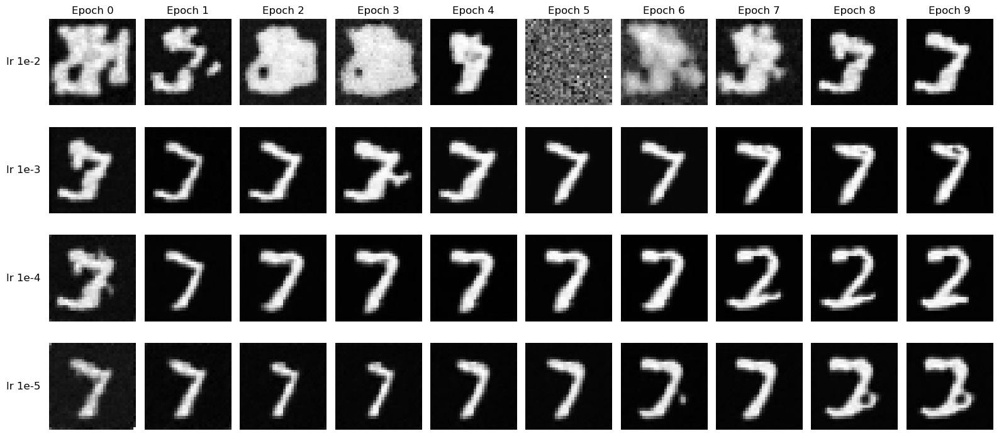

In [ ]:
frames_dict = {
    "lr 1e-2": np.load("exps/mnist_lr1e-2/frames.npy"),
    "lr 1e-3": np.load("exps/mnist_lr1e-3/frames.npy"),
    "lr 1e-4": np.load("exps/mnist_lr1e-4/frames.npy"),
    "lr 1e-5": np.load("exps/mnist_lr1e-5/frames.npy"),
}

plot_training_progress(frames_dict)

The learning process is sensitive to the learning rate. For `lr=1e-2`training becomes unstable around Epoch 5 (where it collapses into noise) and never fully recovers. `lr=1e-3`converges and stays stable. Other values converge relatively quickly and are stable forming a "7" shape, but later switch to a vague "2" likely due to the resemblance between the two digits. From now on we fix `lr=1e-4`

### num_timesteps

In [ ]:
!python ddpm.py --dataset mnist --num_timesteps 50 --experiment_name mnist_timesteps50 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --num_timesteps 100 --experiment_name mnist_timesteps100 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --num_timesteps 500 --experiment_name mnist_timesteps500 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --num_timesteps 1000 --experiment_name mnist_timesteps1000 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --num_timesteps 1500 --experiment_name mnist_timesteps1500 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --num_timesteps 2000 --experiment_name mnist_timesteps2000 --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4

Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 116.76it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1500/1500 [00:12<00:00, 116.93it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 2000/2000 [00:19<00:00, 105.16it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


/tmp/ipykernel_2237539/3984523973.py:40: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  axes[row, 0].annotate(name, xy=(-0.1, 0.5), xycoords='axes fraction',


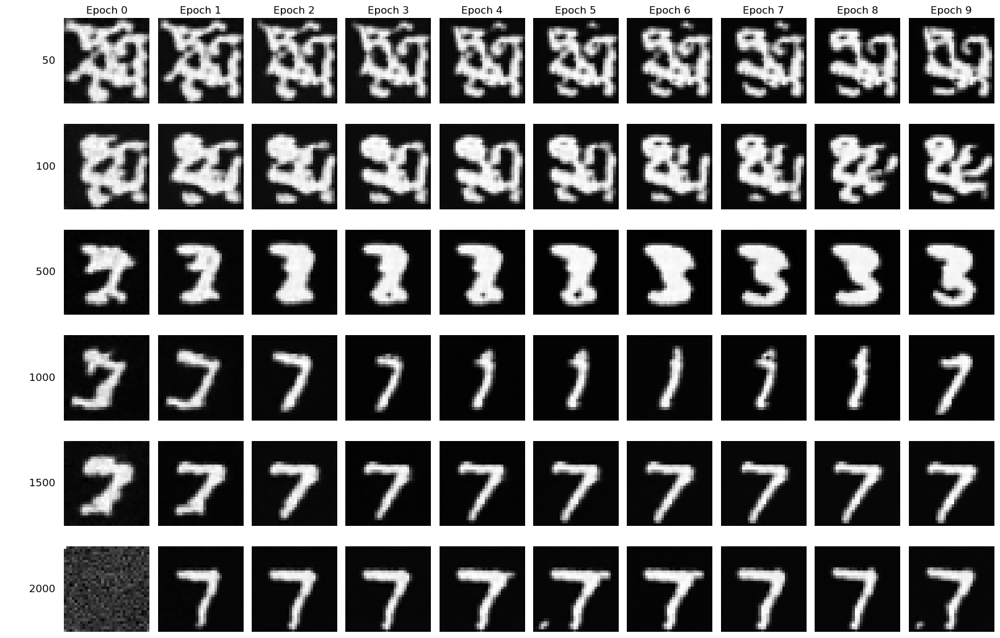

In [ ]:

frames_dict = {
    "        50": np.load("exps/mnist_timesteps50/frames.npy"),
    "       100": np.load("exps/mnist_timesteps100/frames.npy"),
    "       500": np.load("exps/mnist_timesteps500/frames.npy"),
    "       1000": np.load("exps/mnist_timesteps1000/frames.npy"),
    "       1500": np.load("exps/mnist_timesteps1500/frames.npy"),
    "       2000": np.load("exps/mnist_timesteps2000/frames.npy"),
}

plot_training_progress(frames_dict)

A longer diffusion process results in a better output. The model has more “time” to gradually remove noise, which can improve detail and sharpness but comes at a higher computational cost

### beta schedule

In [ ]:
!python ddpm.py --dataset mnist --beta_schedule quadratic --experiment_name mnist_quadratic_schedule --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --experiment_name mnist_lin_schedule --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4


Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 115.12it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 113.04it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


/tmp/ipykernel_2158084/3984523973.py:40: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  axes[row, 0].annotate(name, xy=(-0.1, 0.5), xycoords='axes fraction',


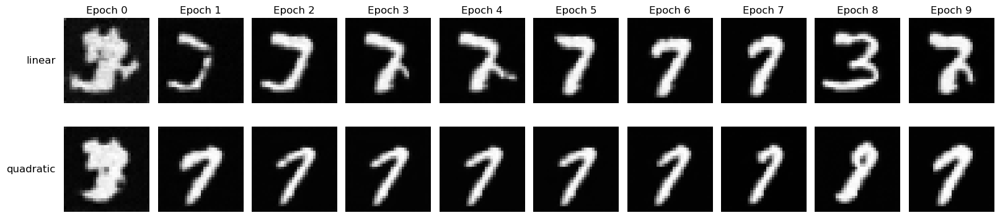

In [ ]:
frames_dict = {
    "linear": np.load("exps/mnist_lin_schedule/frames.npy"),
    "quadratic": np.load("exps/mnist_quadratic_schedule/frames.npy"),
}

plot_training_progress(frames_dict)

A linear beta schedule tends to produce more noise early on, leading to fuzzier shapes, while a quadratic schedule stabilizes faster and yields sharper digits sooner.

### Time embedding

In [ ]:
!python ddpm.py --dataset mnist --time_embedding sinusoidal --experiment_name mnist_time_emb_sinusoidal --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --time_embedding learnable --experiment_name mnist_time_emb_learnable --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --time_embedding linear --experiment_name mnist_time_emb_linear --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4
!python ddpm.py --dataset mnist --time_embedding zero --experiment_name mnist_time_emb_zeros --num_epochs 10  --eval_batch_size 1 --learning_rate 1e-4

Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:08<00:00, 117.15it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
Training model...
GPU name: NVIDIA RTX A5000 

100%|██████████████████████████████████████| 1000/1000 [00:07<00:00, 127.69it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


/tmp/ipykernel_2158084/3984523973.py:40: UserWarning: You have used the `textcoords` kwarg, but not the `xytext` kwarg.  This can lead to surprising results.
  axes[row, 0].annotate(name, xy=(-0.1, 0.5), xycoords='axes fraction',


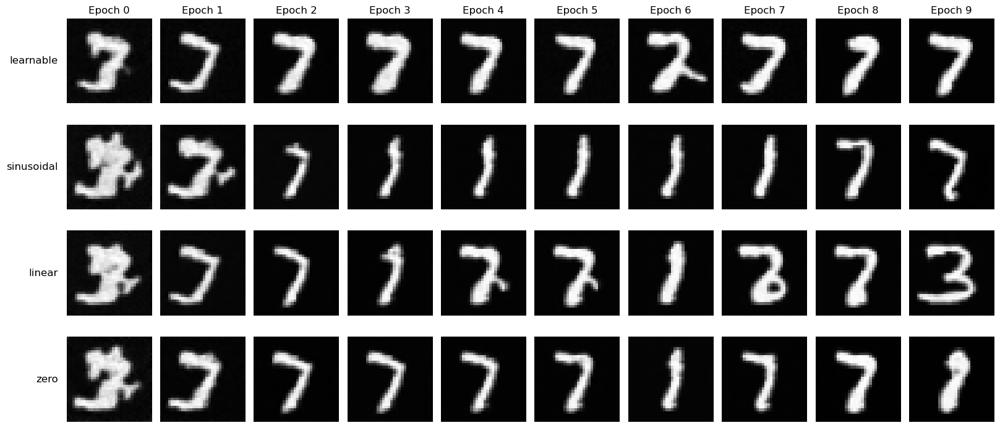

In [ ]:
frames_dict = {
    "learnable": np.load("exps/mnist_time_emb_learnable/frames.npy"),
    "sinusoidal": np.load("exps/mnist_time_emb_sinusoidal/frames.npy"),
    "linear": np.load("exps/mnist_time_emb_linear/frames.npy"),
    "zero": np.load("exps/mnist_time_emb_zeros/frames.npy"),
}

plot_training_progress(frames_dict)

Learnable and sinusoidal embeddings converge faster and are stable providing sharp digits, whereas linear is slower and zero embedding often produces fuzzier outputs that hesitate between different digits over the epochs